<a href="https://colab.research.google.com/github/singhals163/SURGE-22/blob/master/Color_Constancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Color Constancy Algorithms
This method aims at equaling the illuminance of all the pixels by dividing them with the illuminance
for each channel.<br> In general, any pixel can be defined as:


\begin{equation}
f_i (x,y) = G(x,y)R_i(x,y)I_i
\end{equation}

Here $G_i(x,y)$ is the Geometric factor, $R_i(x,y)$ is the reflectance factor and $I_i$ is the Illuminance of the $i^{th}$ channel.<br>
The idea is to make the illuminance of all the pixels equal by dividing the pixel value by the illuminance so that every pixel can be considered to have illuminance $\{1,1,1\}$.

## White Patch
This algorithm takes into account the highest value in each color channel as the white representation for the image.<br>Computationally, such values are found from the maximum intensity in each channel $I_i = max\{f_i(x, y)\}$.

## Gray World
It is based on the assumption that, the colors found in real world images tend to a gray tone, and hence the illuminant is estimated using the average color of all pixels. This algorithm consists in computing the illuminant based on $a_i = mean\{f_i (x, y)\}$. Some assumptions are proposed in for simplifying the method, and the illuminant is adopted as $I_i ≈ 2a_i$.

Then, the outcome image for both algorithms is given by

\begin{equation}
f_i^\prime(x,y) = \frac{f_i(x,y)}{I_i}
\end{equation}


In [ ]:
import cv2
import numpy
import numpy as np
import matplotlib
from google.colab.patches import cv2_imshow

In [ ]:
def read_image(path):
  image = cv2.imread(path, cv2.IMREAD_COLOR)
  size = 500
  dim = (size, (int)(image.shape[0]/image.shape[1]*size))
  image = cv2.resize(image, dim)
  cv2_imshow(image)
  return image

In [ ]:
def white_patch(image):
  (B, G, R) = cv2.split(image)
  B = (B/numpy.amax(B))*255
  G = (G/numpy.amax(G))*255
  R = (R/numpy.amax(R))*255

  img_white = cv2.merge([B,G,R])
  # cv2_imshow(img_white)
  return img_white

In [ ]:
def gray_world(image):
  (B, G, 
   R) = cv2.split(image)
  B = (B/(2*numpy.mean(B)))*255
  G = (G/(2*numpy.mean(G)))*255
  R = (R/(2*numpy.mean(R)))*255

  img_gray = cv2.merge([B,G,R])
  cv2_imshow(img_gray)
  return img_gray

In [ ]:
def image_process(path):
  print("Real Image")
  image = read_image(path)
  print("White patch")
  img_white = white_patch(image)
  print("Gray World")
  img_gray = gray_world(image)
  return

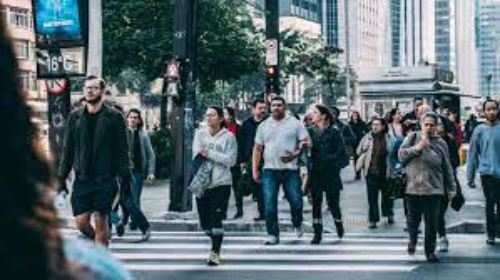

In [ ]:
image = read_image("/content/drive/MyDrive/SURGE/Color_Constancy/download.jpeg")
# imShow("/content/drive/MyDrive/SURGE/Color_Contancy/download.jpeg")

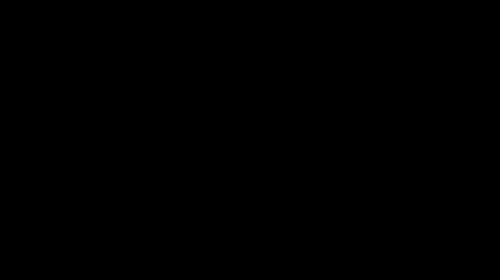

In [ ]:
img_dark = numpy.divide(image,255)
cv2_imshow(img_dark)
cv2.waitKey(0)
cv2.destroyAllWindows()

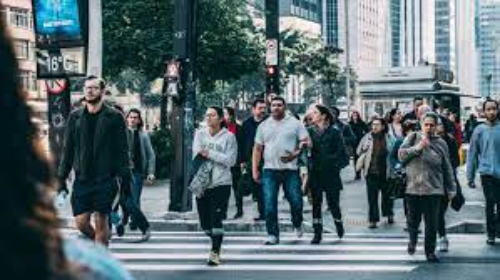

In [ ]:
img_white = white_patch(img_dark)

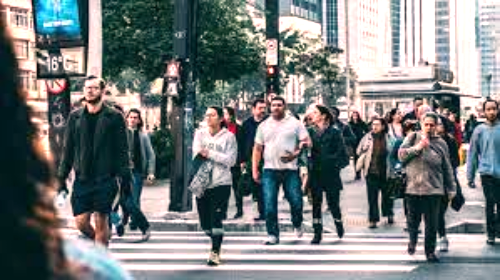

In [ ]:
img_gray = gray_world(img_dark)

Real Image


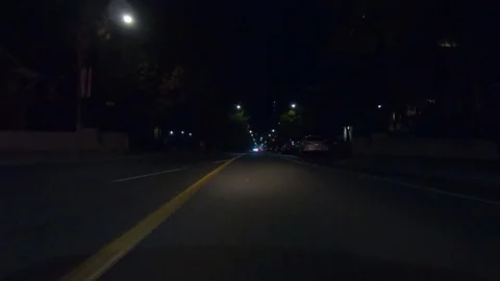

White patch


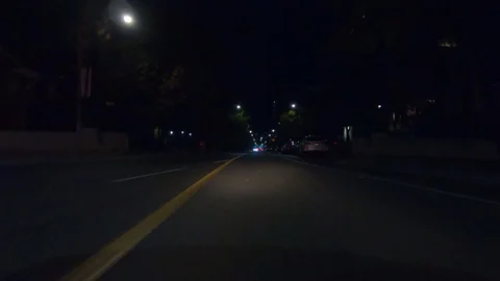

Gray World


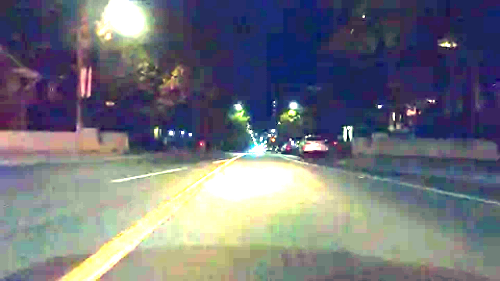

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp")

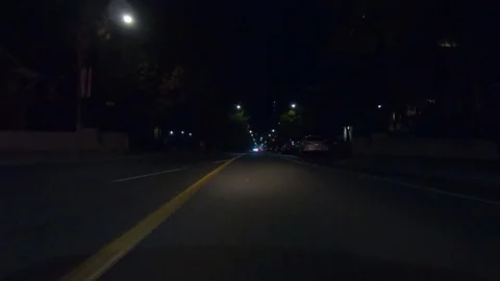

281 500
float64


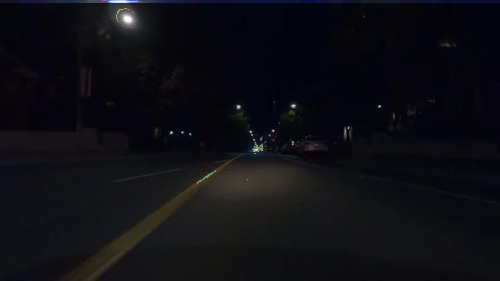

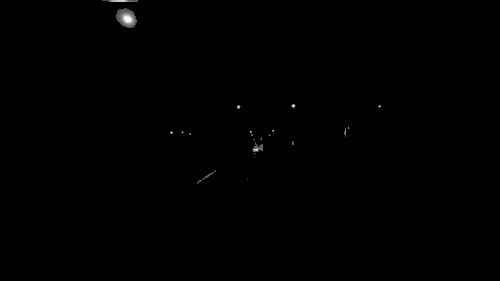

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
size = 500
dim = (size, (int)(image.shape[0]/image.shape[1]*size))
image = cv2.resize(image, dim)
cv2_imshow(image)

(B,G,R) = cv2.split(image)
(H, W, _) = numpy.shape(image)
print(H,W)

WP_image = image
filter = 80
max = 0

separate = np.zeros((H,W,3))

for k in range(3):
  for i in range(H):
    for j in range(W):
      if(WP_image[i][j][k]>=filter):
        separate[i][j] = WP_image[i][j][k]
        WP_image[i][j][k] = 0
  WP_image[:][:][k] = WP_image[:][:][k]/np.amax(WP_image[:][:][k]))*255

separate = separate.astype('float64')
print(separate.dtype)
WP_image = np.add(separate,WP_image)
# separate = np.zeros((H,W))
cv2_imshow(WP_image)
cv2_imshow(WP_image-image)

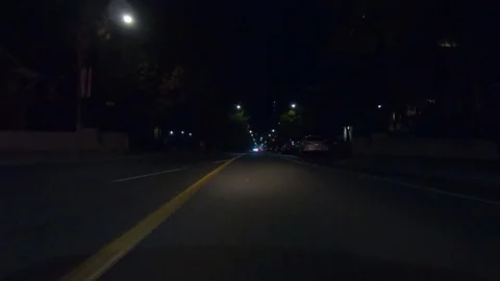

281 500


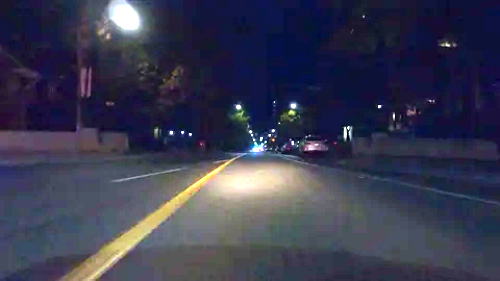

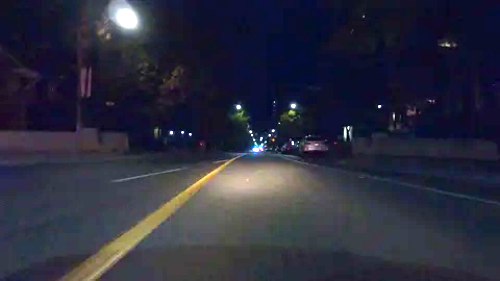

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
size = 500
dim = (size, (int)(image.shape[0]/image.shape[1]*size))
image = cv2.resize(image, dim)
cv2_imshow(image)

(B,G,R) = cv2.split(image)
(H, W, _) = numpy.shape(image)
print(H,W)

WP_image = image
filter = 60
max = 0

# separate = np.zeros((H,W,3))

for i in range(H):
  for j in range(W):
    if(B[i][j]>max and B[i][j]<=filter):
      max = B[i][j]
B = (B/max)*255
max = 0
for i in range(H):
  for j in range(W):
    if(G[i][j]>max and G[i][j]<=filter):
      max = G[i][j]
G = (G/max)*255
max = 0
for i in range(H):
  for j in range(W):
    if(R[i][j]>max and R[i][j]<=filter):
      max = R[i][j]
R = (R/max)*255


WP_image = cv2.merge([B,G,R])

# separate = separate.astype('float64')
# print(separate.dtype)
# WP_image = np.add(separate,WP_image)
# separate = np.zeros((H,W))
cv2_imshow(WP_image)
cv2_imshow(WP_image-image)

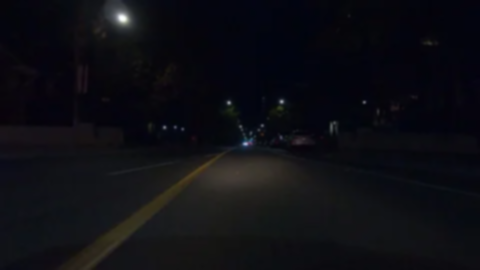

37.0 24.0 27.0


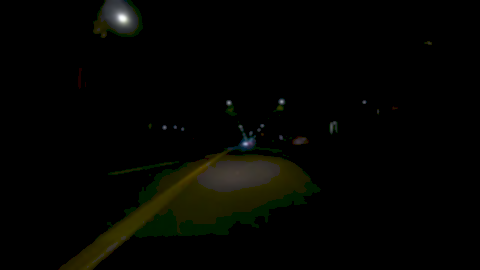

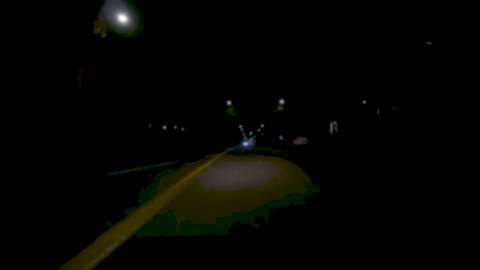

37.0 24.0 27.0


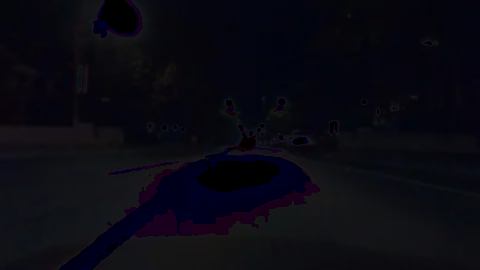

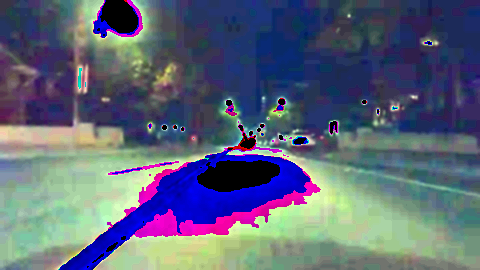

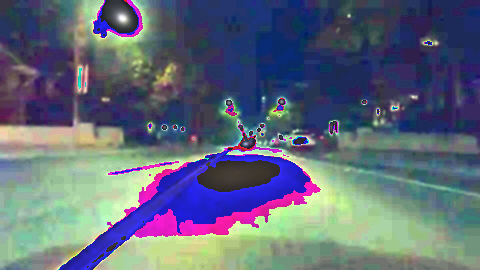

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
image = cv2.GaussianBlur(image,(5,5),0)
cv2_imshow(image)
image1 = image2 = image
(B1,G1,R1) = cv2.split(image1)
ret1, B1 = cv2.threshold(B1,0,255,cv2.THRESH_TOZERO+cv2.THRESH_OTSU)
ret2, G1 = cv2.threshold(G1,0,255,cv2.THRESH_TOZERO+cv2.THRESH_OTSU)
ret3, R1 = cv2.threshold(R1,0,255,cv2.THRESH_TOZERO+cv2.THRESH_OTSU)
print(ret1,ret2,ret3)
image1 = cv2.merge([B1,G1,R1])
cv2_imshow(image1)
image1 = white_patch(image1)

(B2,G2,R2) = cv2.split(image2)
ret1, B2 = cv2.threshold(B2,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_OTSU)
ret2, G2 = cv2.threshold(G2,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_OTSU)
ret3, R2 = cv2.threshold(R2,0,255,cv2.THRESH_TOZERO_INV+cv2.THRESH_OTSU)
print(ret1,ret2,ret3)
image2 = cv2.merge([B2,G2,R2])
cv2_imshow(image2)
image2 = white_patch(image2)
cv2_imshow(image1+image2)


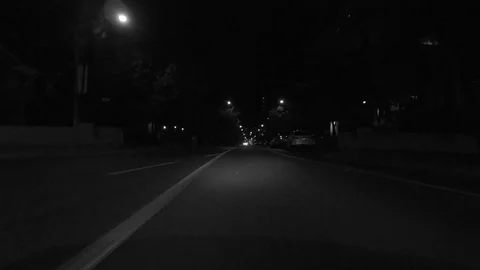

27.0


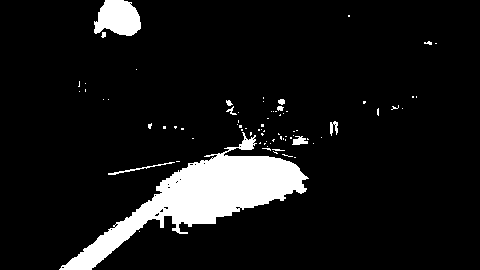

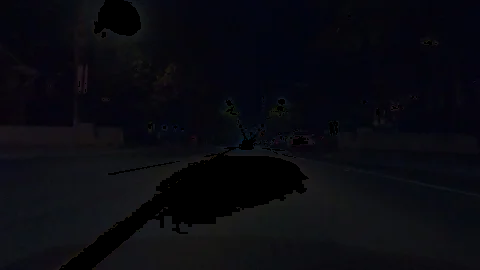

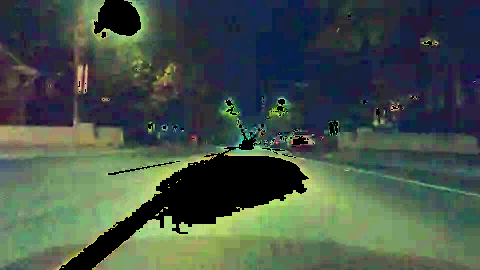

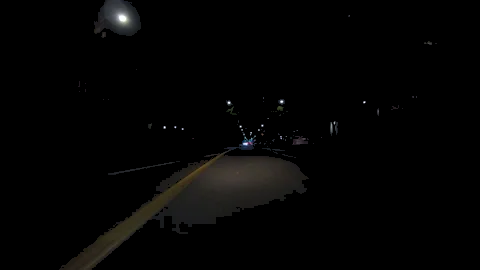

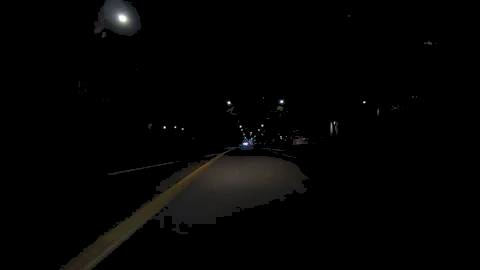

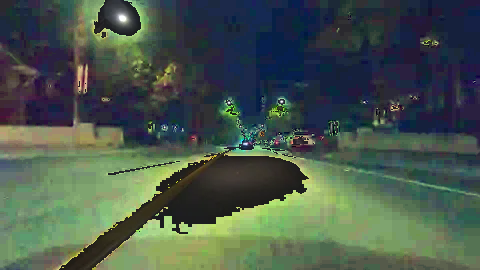

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
# image = cv2.GaussianBlur(image,(5,5),0)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

ret, mask_otsu = cv2.threshold(image_gray, 0, 1, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
print(ret)
cv2_imshow((1-mask_otsu)*255)

image1 = image2 = image

(B1,G1,R1) = cv2.split(image1)
B1 = B1*mask_otsu
G1 = G1*mask_otsu
R1 = R1*mask_otsu
image1 = cv2.merge([B1,G1,R1])
cv2_imshow(image1)
image1 = white_patch(image1)

mask_otsu = 1-mask_otsu
(B2,G2,R2) = cv2.split(image2)
B2 = B2*mask_otsu
G2 = G2*mask_otsu
R2 = R2*mask_otsu
image2 = cv2.merge([B2,G2,R2])
cv2_imshow(image2)
image2 = white_patch(image2)

cv2_imshow(image1+image2)


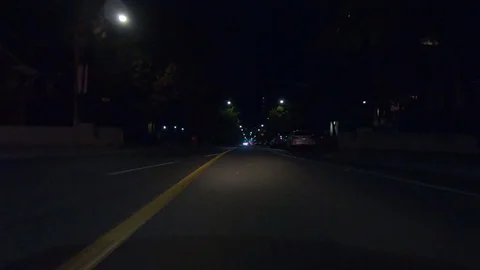

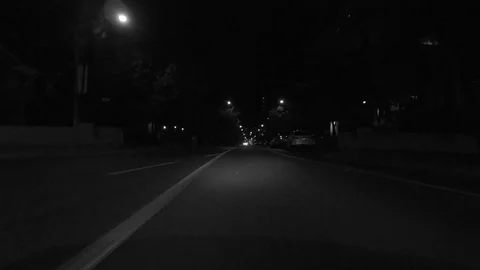

27.0


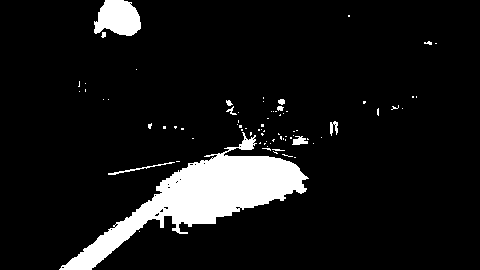

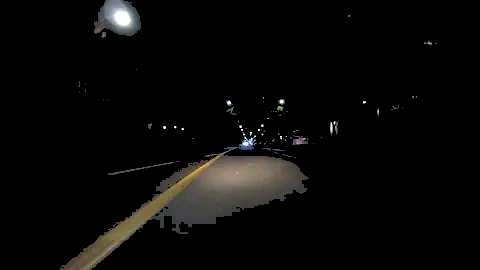

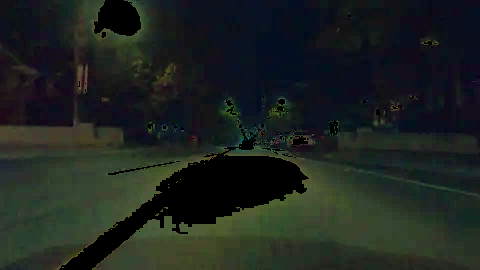

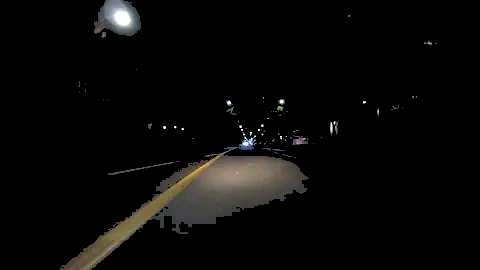

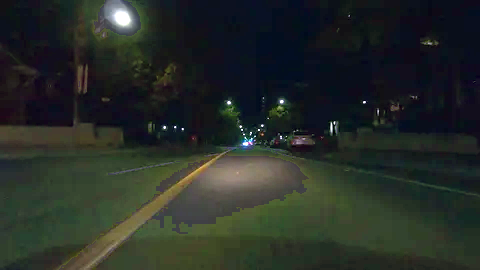

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)
# image = cv2.GaussianBlur(image,(5,5),0)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

ret, mask_otsu = cv2.threshold(image_gray, 0, 1, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
print(ret)
cv2_imshow((1-mask_otsu)*255)

image1 = image2 = image

(B1,G1,R1) = cv2.split(image1)
B1 = (B1*mask_otsu)
G1 = (G1*mask_otsu)
R1 = (R1*mask_otsu)

# image1 = cv2.merge([B1,G1,R1])
# cv2_imshow(image1)
# image1 = white_patch(image1)

mask_otsu = 1-mask_otsu
(B2,G2,R2) = cv2.split(image2)
B2 = B2*mask_otsu
G2 = G2*mask_otsu
R2 = R2*mask_otsu
# image2 = cv2.merge([B2,G2,R2])
# cv2_imshow(image2)
B2 = (B2/110.0)*255
G2 = (G2/110.0)*255
R2 = (R2/110.0)*255
image2 = cv2.merge([B2,G2,R2])
cv2_imshow(image2)

(B2,G2,R2) = cv2.split(image2)
B1 = ((B1*110.0)/np.amax(B1))
G1 = ((G1*110.0)/np.amax(G1))
R1 = ((R1*110.0)/np.amax(R1))
image1 = cv2.merge([B1,G1,R1])
cv2_imshow(image1)
cv2_imshow(image2)
cv2_imshow(image1+image2)


In [ ]:
def white_patch_window(image, size):
  H, W, _ = image.shape
  size_half = (int)(size/2)
  image1 = cv2.copyMakeBorder(image, top = size_half, bottom = size_half, left = size_half, right = size_half, borderType = cv2.BORDER_CONSTANT)

# size_half = (int)size/2
  for k in range(3):
    for i in range(H):
      for j in range(W):
        x = image1[(i):(i+size), (j):(j+size), k].copy()
        # x  = (x/np.amax(x))*255
        image[i][j][k] = (x[size_half][size_half]/np.amax(x))*255
  return image

In [ ]:
def gray_world_window(image, size):
  H, W, _ = image.shape
  size_half = (int)(size/2)
  image1 = cv2.copyMakeBorder(image, top = size_half, bottom = size_half, left = size_half, right = size_half, borderType = cv2.BORDER_CONSTANT)

# size_half = (int)size/2
  for k in range(3):
    for i in range(H):
      for j in range(W):
        x = image1[(i):(i+size), (j):(j+size), k].copy()
        # x  = (x/np.amax(x))*255
        image[i][j][k] = (image[i][j][k]/np.mean(x))*255
  return image

In [ ]:
def white_patch_window_gray(image, size):
  H, W, _ = image.shape
  size_half = (int)(size/2)
  image1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image2 = image1
  image1 = cv2.copyMakeBorder(image, top = size_half, bottom = size_half, left = size_half, right = size_half, borderType = cv2.BORDER_CONSTANT)

# size_half = (int)size/2
  # for k in range(3):
  for i in range(H):
    for j in range(W):
      x = np.amax(image1[(i):(i+size), (j):(j+size)])
      image2[i][j] = x
  image3 = image
  for k in range(3):
    for i in range(H):
      for j in range(W):
        image3[i][j][k] = image3[i][j][k]/image2[i][j]*255
  return image3

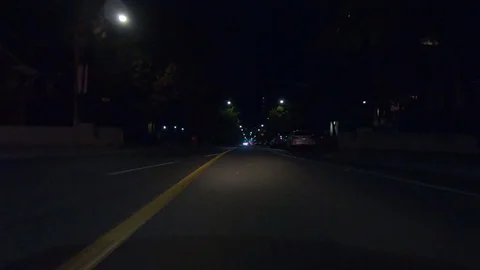

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in ubyte_scalars
  if sys.path[0] == '':


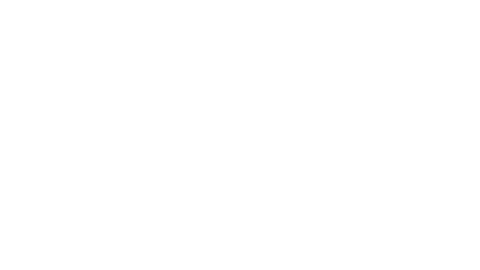

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,3)

cv2_imshow(image+(255-image1))


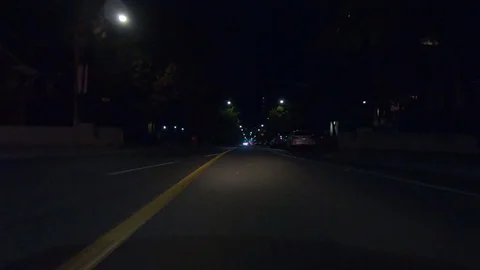

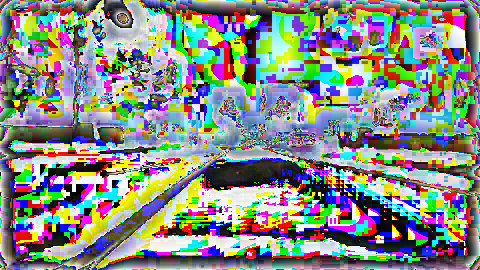

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = gray_world_window(image,31)

cv2_imshow(image1)


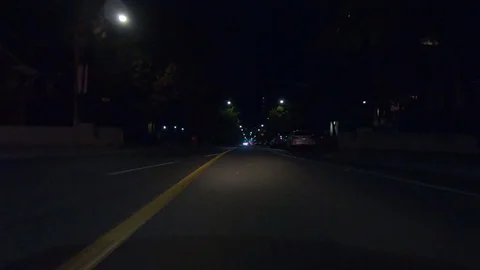

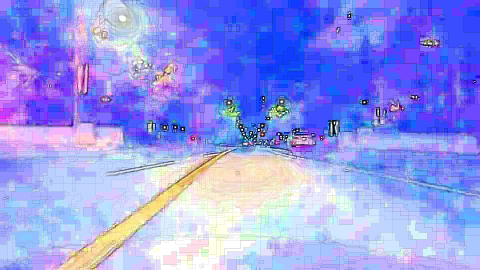

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,3)

cv2_imshow(image1)


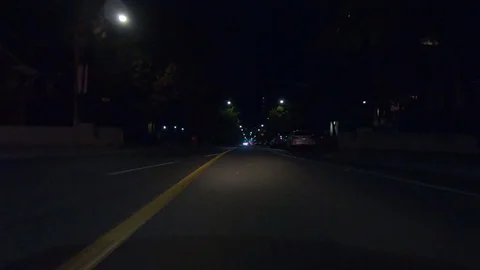

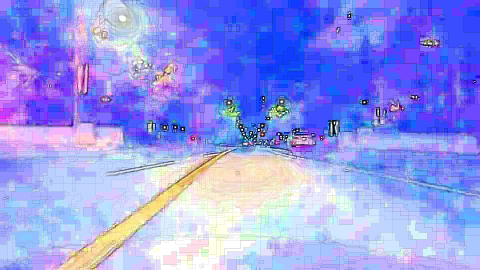

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,3)

cv2_imshow(image1)


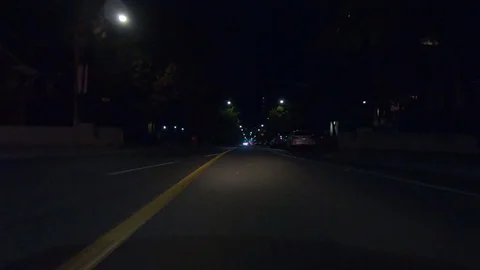

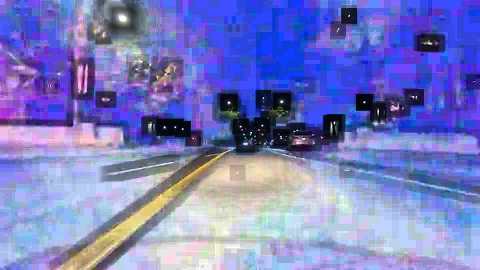

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,15)

cv2_imshow(image1)


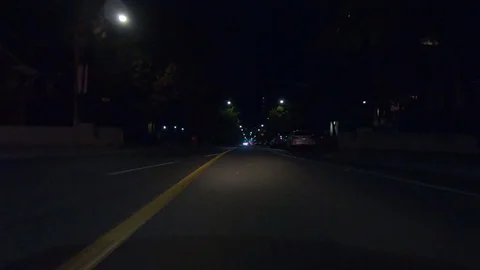

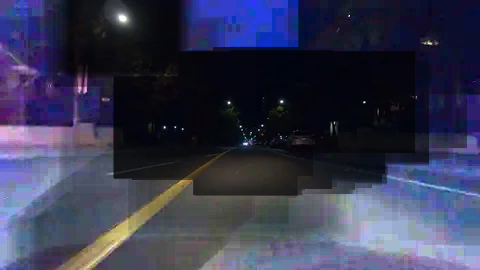

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,101)

cv2_imshow(image1)


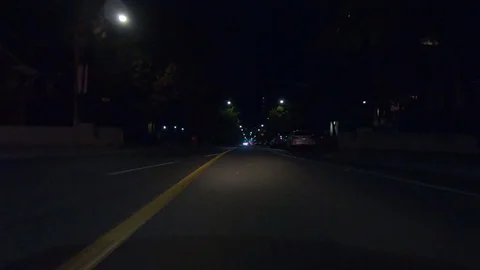

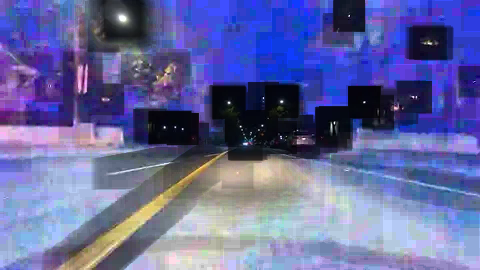

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,31)

cv2_imshow(image1)


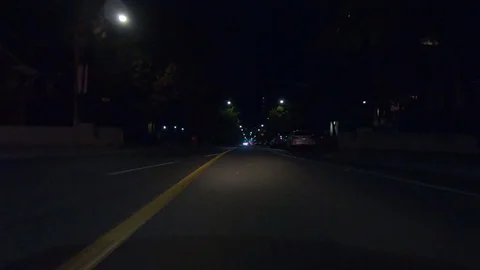

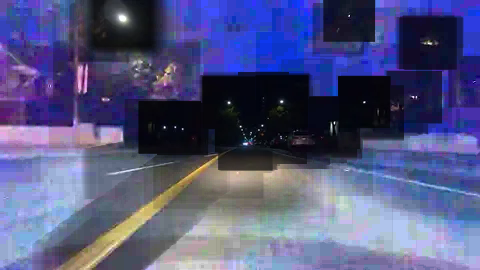

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window_gray(image,51)

cv2_imshow(image1)


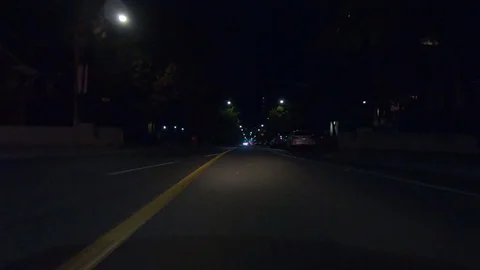

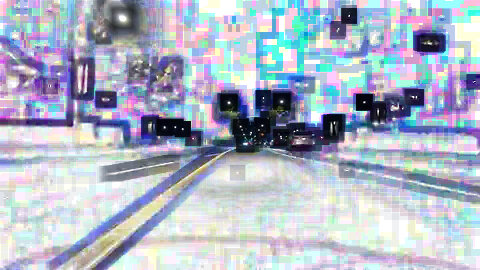

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,15)

cv2_imshow(image1)


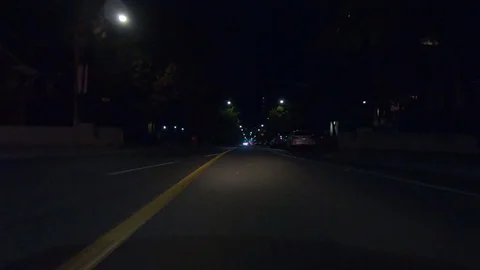

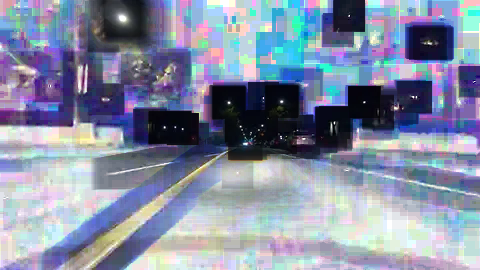

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,31)

cv2_imshow(image1)


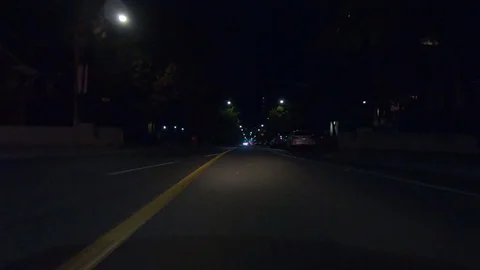

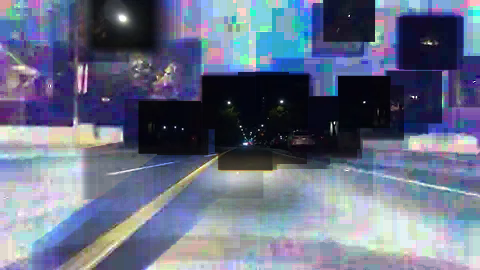

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,51)

cv2_imshow(image1)


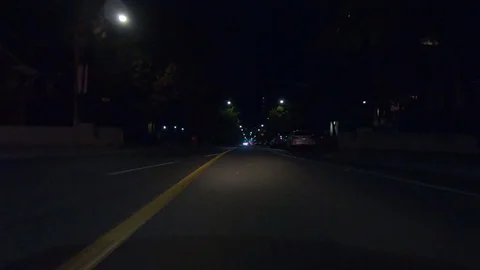

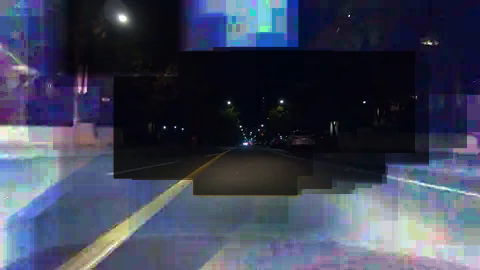

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,101)

cv2_imshow(image1)


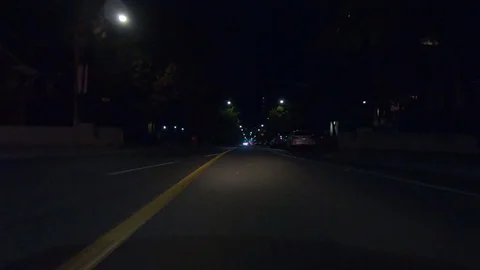

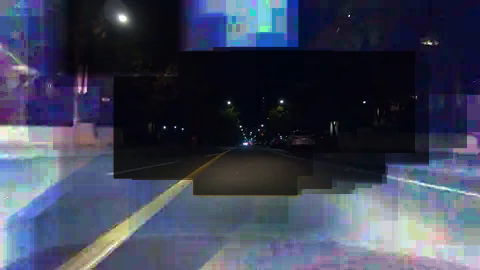

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,101)

cv2_imshow(image1)


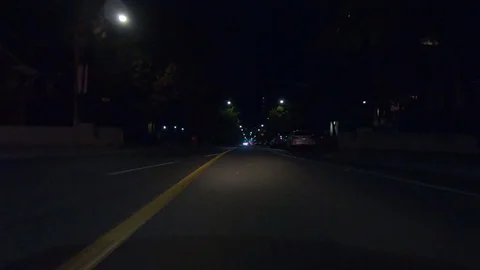

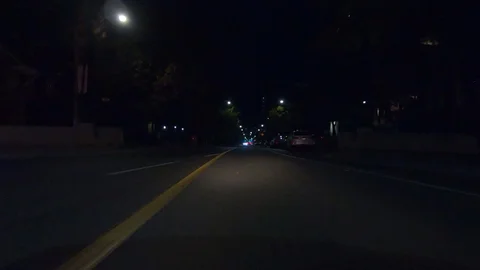

In [ ]:
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
cv2_imshow(image)

image1 = white_patch_window(image,501)

cv2_imshow(image1)


In [ ]:
a = np.arange(10).reshape((5,2))
print(a)
b = a[1:5, :].copy()
b[0][:] = 1
print(b)
print(b)

[[0 1]
 [2 3]
 [4 5]
 [6 7]
 [8 9]]
[[1 1]
 [4 5]
 [6 7]
 [8 9]]
[[1 1]
 [4 5]
 [6 7]
 [8 9]]


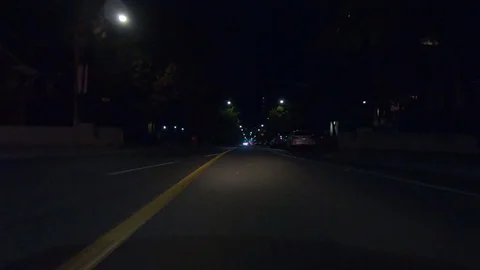

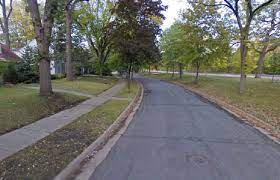

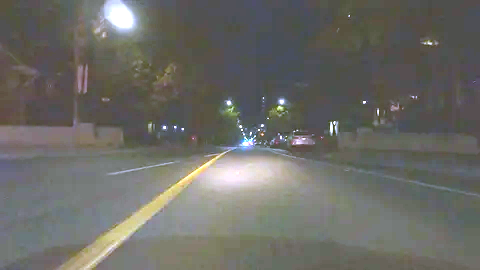

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
image2 = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/download (1).jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(image2)
image1 = image

(B1, G1, R1) = cv2.split(image1)
(B2, G2, R2) = cv2.split(image2)
B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
G1 = (G1-np.mean(G1))*np.std(G2)/np.std(G1) + np.mean(G2)
R1 = (R1-np.mean(R1))*np.std(R2)/np.std(R1) + np.mean(R2)

image1 = cv2.merge([B1,G1,R1])

cv2_imshow(image1)

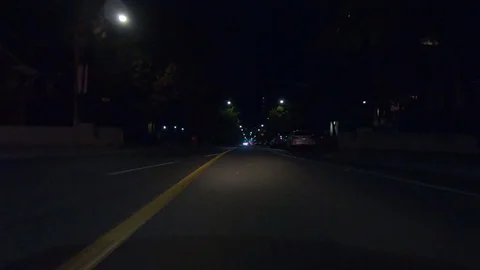

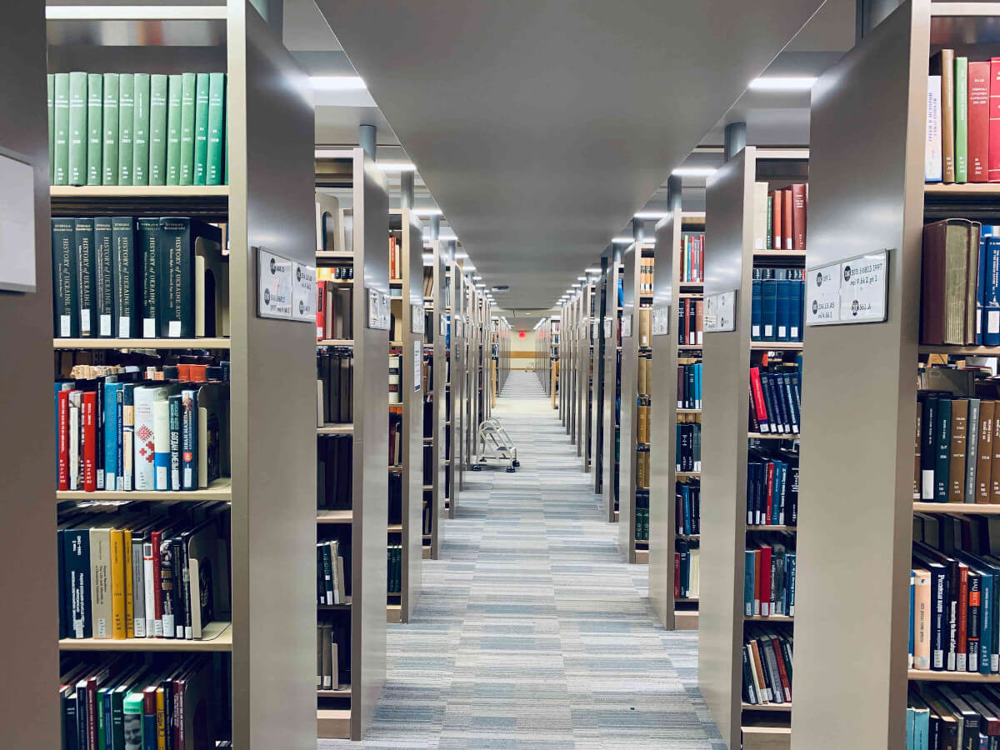

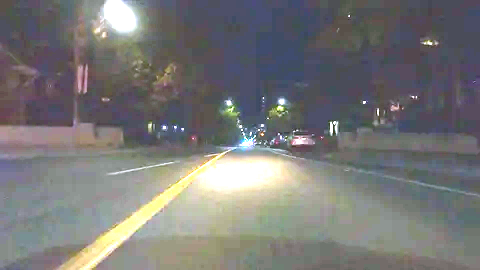

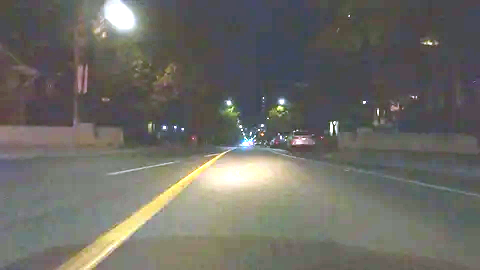

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
image2 = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/hero3.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(image2)
image1 = image

(B1, G1, R1) = cv2.split(image1)
(B2, G2, R2) = cv2.split(image2)
B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
G1 = (G1-np.mean(G1))*np.std(G2)/np.std(G1) + np.mean(G2)
R1 = (R1-np.mean(R1))*np.std(R2)/np.std(R1) + np.mean(R2)

image1 = cv2.merge([B1,G1,R1])
# image2 = cv2.GaussianBlur(image1,(5,5),0)
cv2_imshow(image1)
cv2_imshow(image1-image)

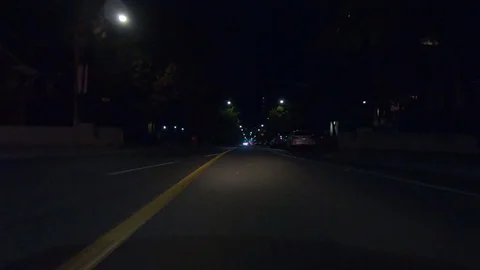

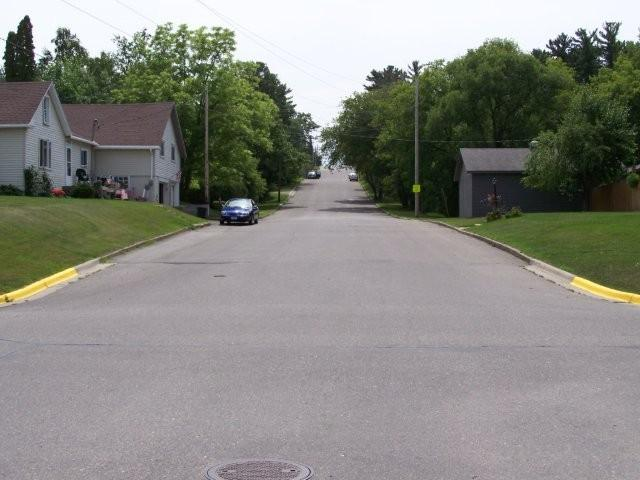

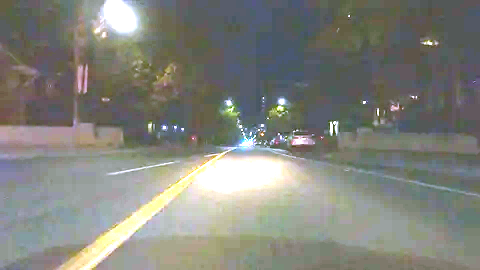

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/1.webp", cv2.IMREAD_COLOR)
image2 = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/100_3106.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(image2)
image1 = image

(B1, G1, R1) = cv2.split(image1)
(B2, G2, R2) = cv2.split(image2)
B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
G1 = (G1-np.mean(G1))*np.std(G2)/np.std(G1) + np.mean(G2)
R1 = (R1-np.mean(R1))*np.std(R2)/np.std(R1) + np.mean(R2)

image1 = cv2.merge([B1,G1,R1])

cv2_imshow(image1)

Real Image


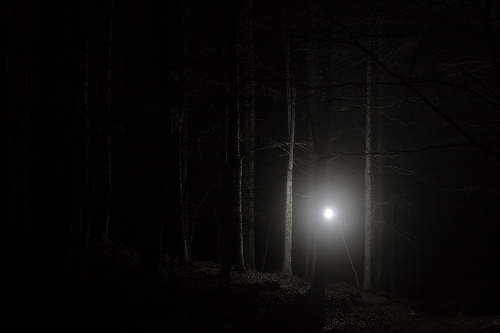

White patch


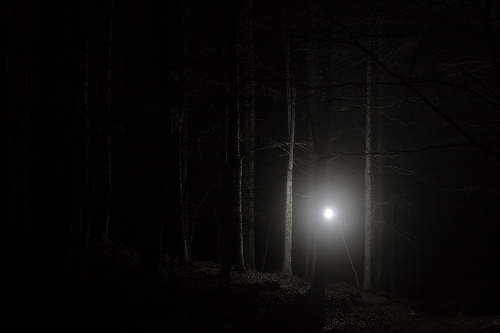

Gray World


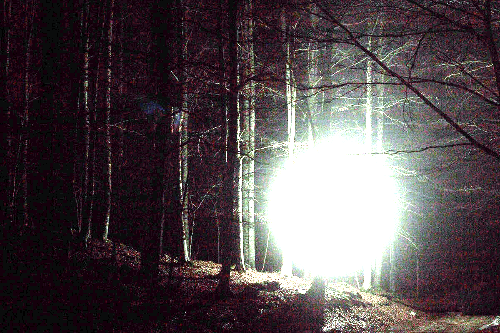

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/11319533851690.56ba7bb370775.jpg")

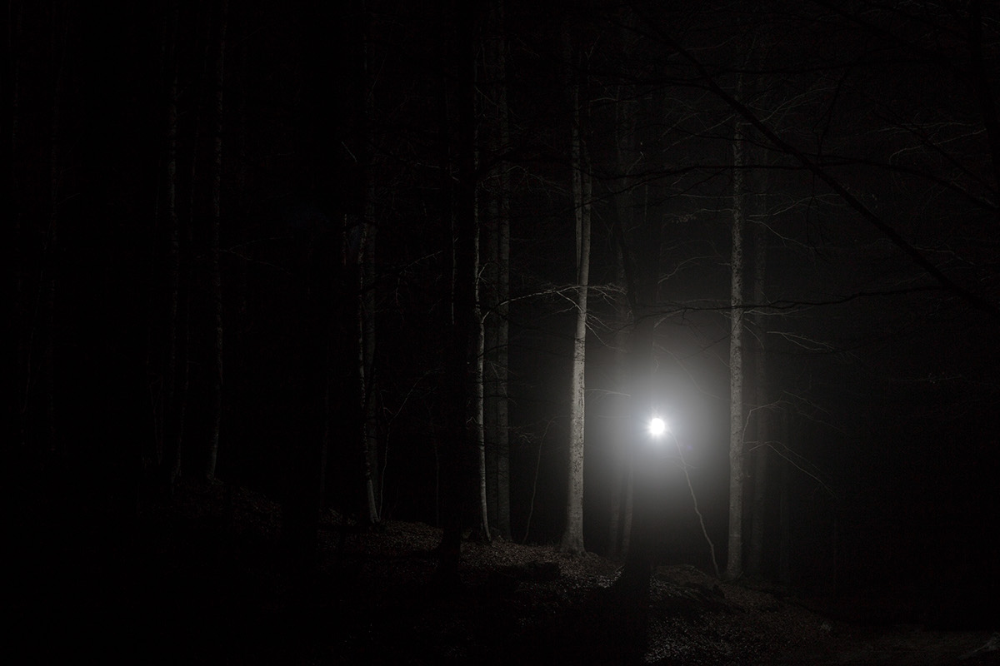

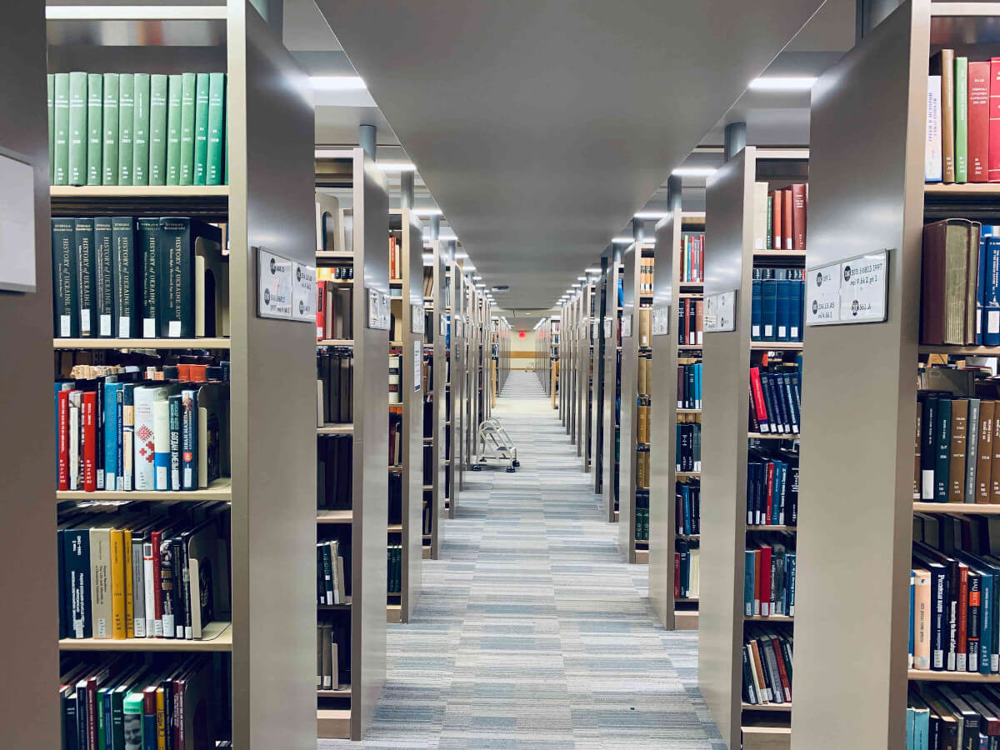

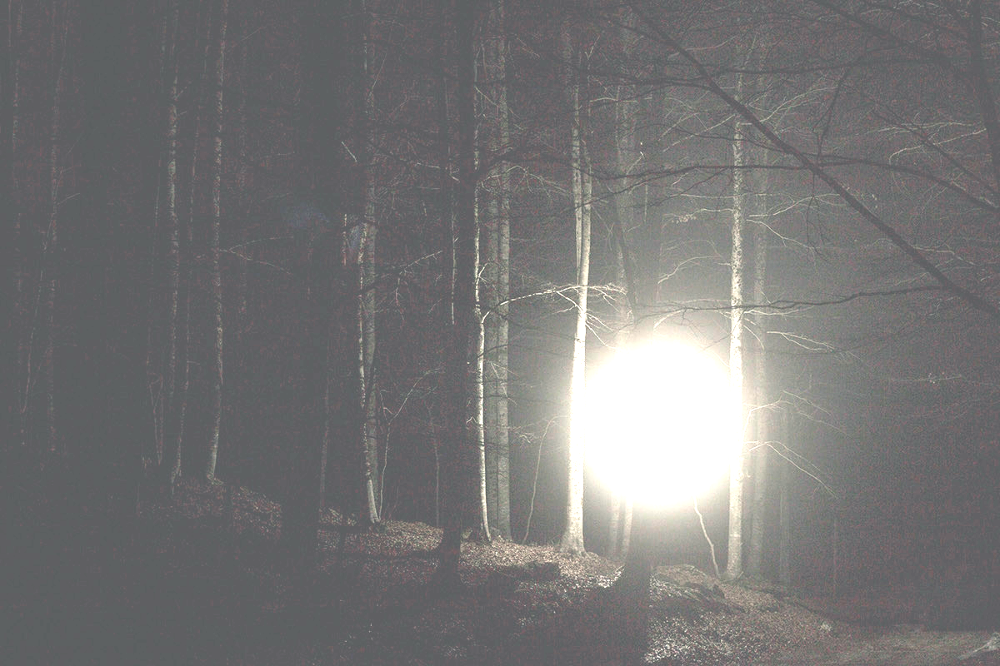

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/11319533851690.56ba7bb370775.jpg", cv2.IMREAD_COLOR)
image2 = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/hero3.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(image2)
image1 = image

(B1, G1, R1) = cv2.split(image1)
(B2, G2, R2) = cv2.split(image2)
B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
G1 = (G1-np.mean(G1))*np.std(G2)/np.std(G1) + np.mean(G2)
R1 = (R1-np.mean(R1))*np.std(R2)/np.std(R1) + np.mean(R2)

image1 = cv2.merge([B1,G1,R1])
# image2 = cv2.GaussianBlur(image1,(5,5),0)
cv2_imshow(image1)

Real Image


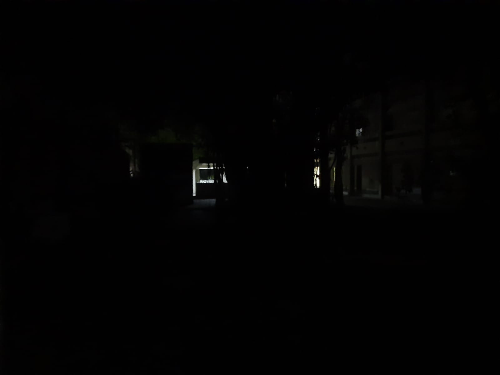

White patch


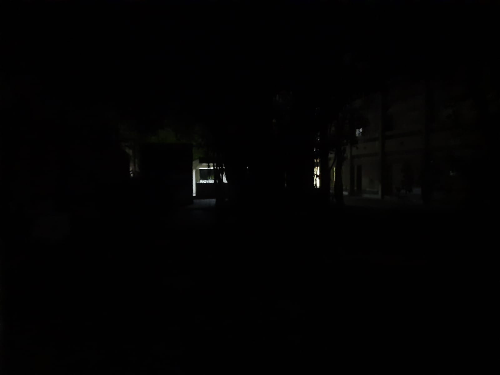

Gray World


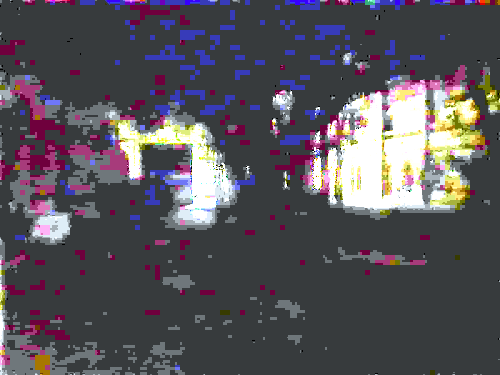

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/WhatsApp Image 2022-05-19 at 11.56.19 PM.jpeg")

Real Image


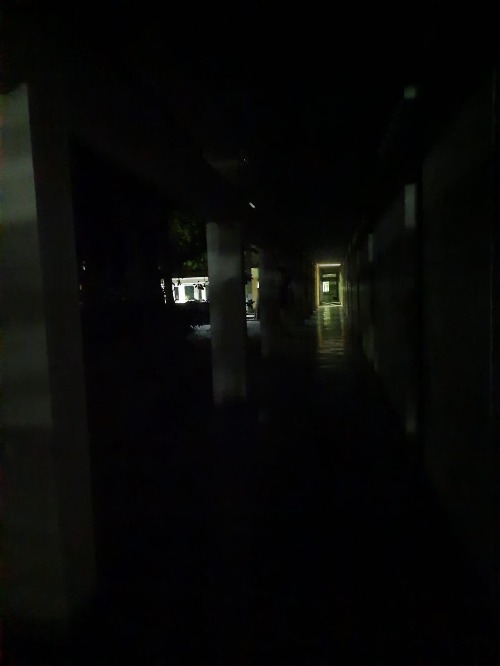

White patch


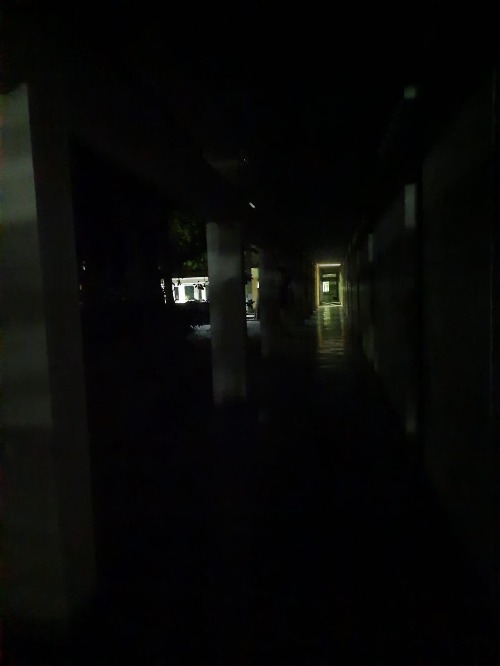

Gray World


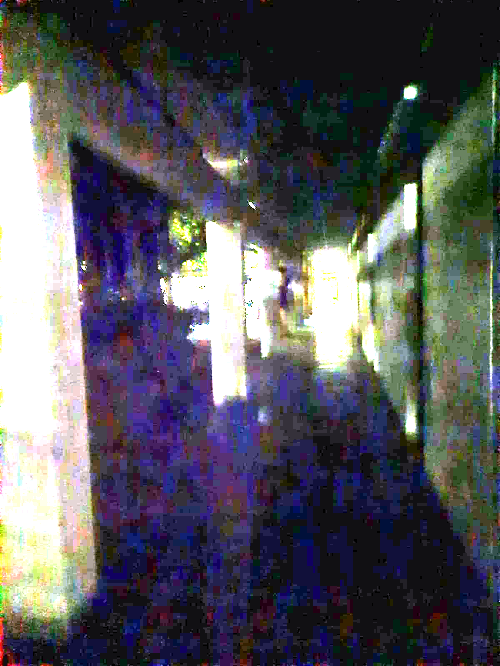

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/WhatsApp Image 2022-05-19 at 11.56.18 PM.jpeg")

Real Image


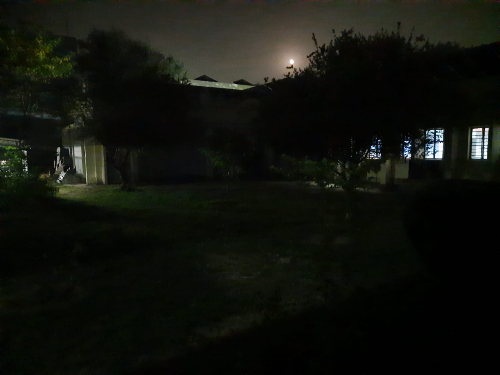

White patch


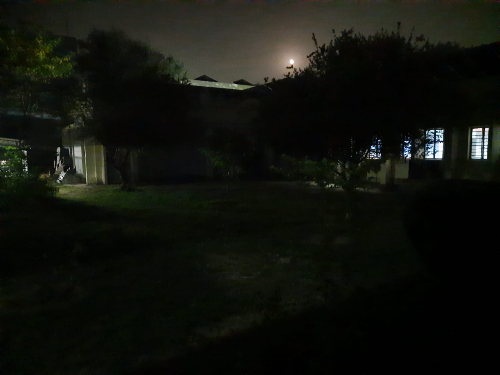

Gray World


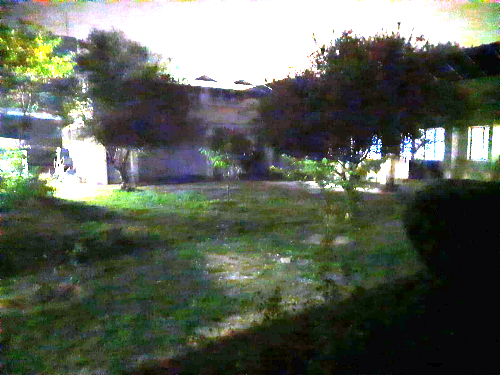

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/WhatsApp Image 2022-05-19 at 11.56.18 PM (1).jpeg")

Real Image


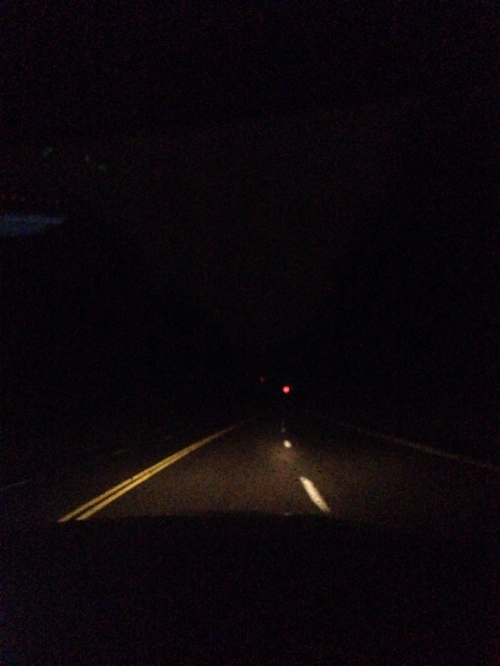

White patch


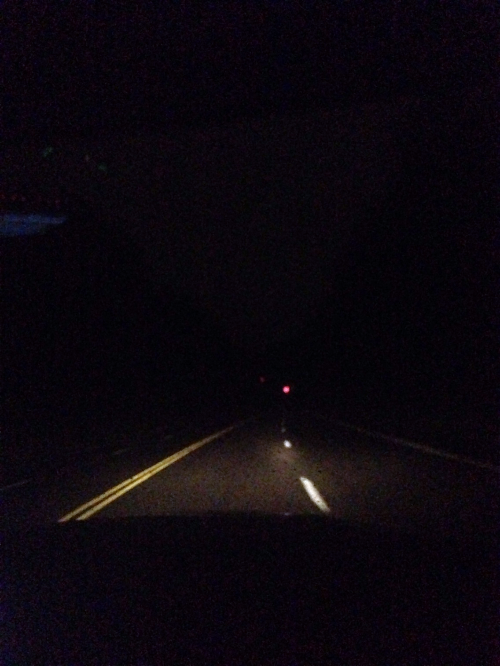

Gray World


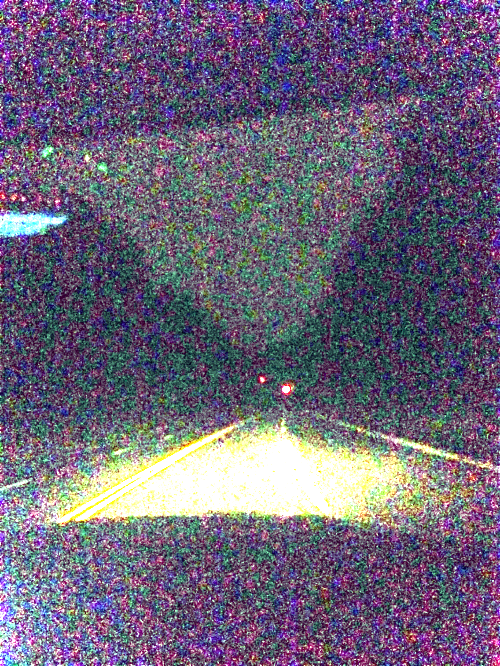

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/vsco_042614.jpg")

Real Image


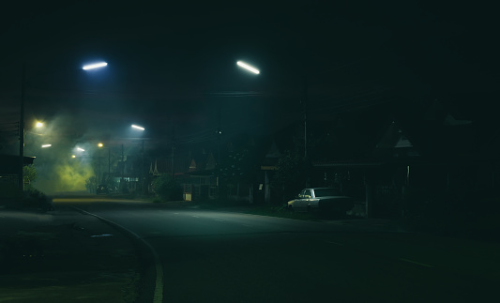

White patch


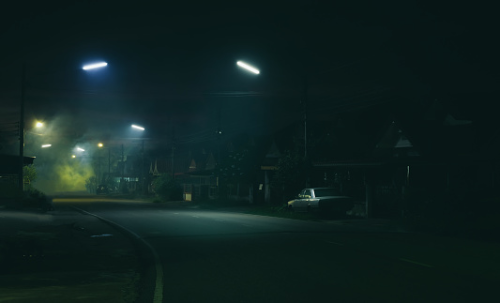

Gray World


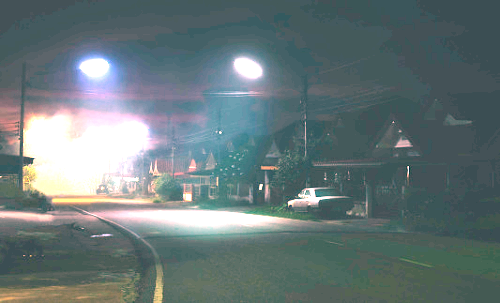

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/istockphoto-1151075791-170667a.jpg")

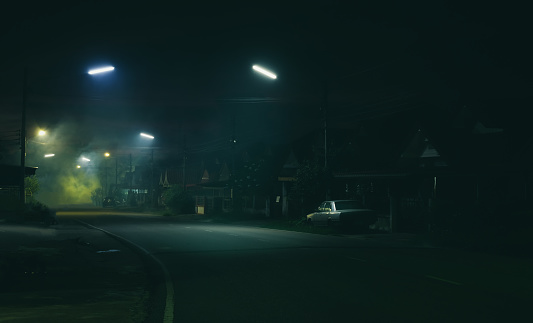

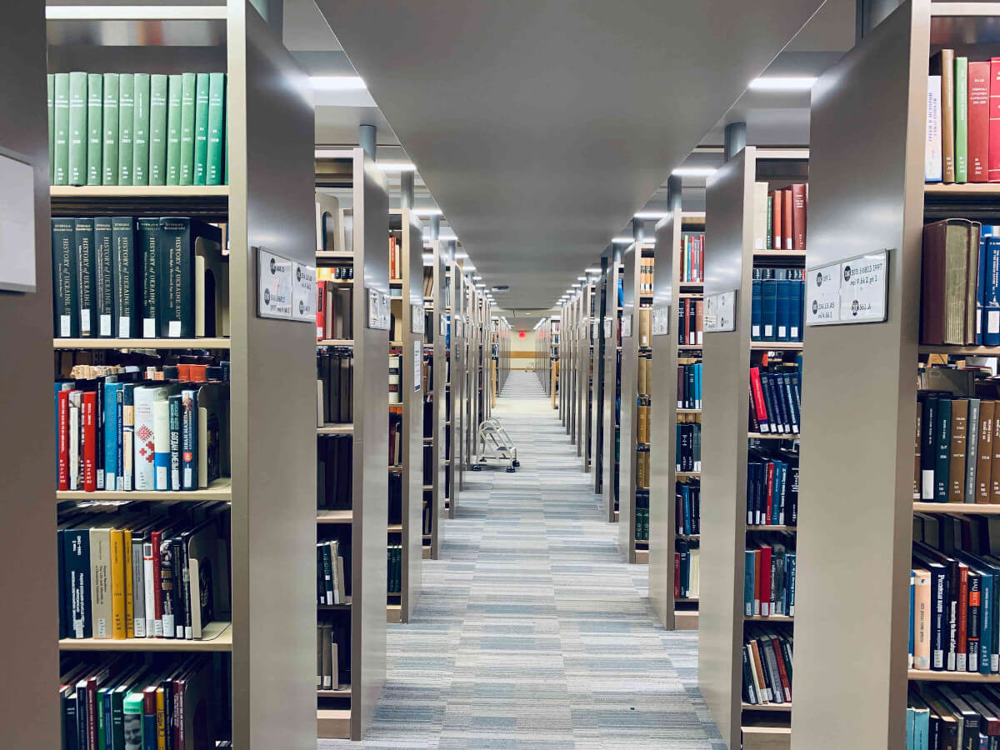

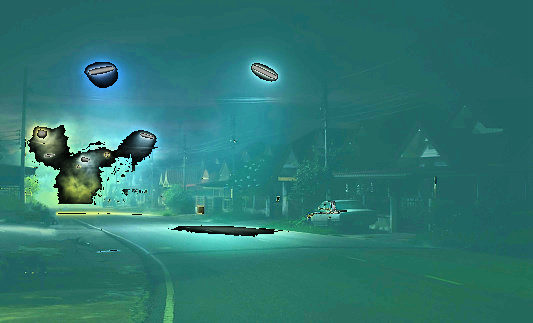

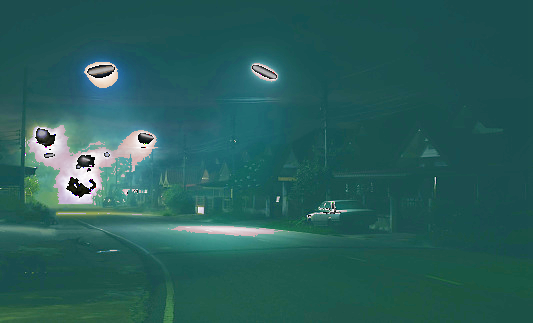

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/istockphoto-1151075791-170667a.jpg", cv2.IMREAD_COLOR)
reference = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/hero3.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(reference)
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
image2 = cv2.cvtColor(reference, cv2.COLOR_BGR2HSV)

V1 = image1[:,:,2]
V2 = image2[:,:,2]
# image1[:,:,2] = image[:,:,2]
# (H1, S1, V1) = cv2.split(image1)
# (H2, S2, V2) = cv2.split(image2)
# B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
# G1 = (G1-np.mean(G1))*np.std(G2)/np.std(G1) + np.mean(G2)
V1 = (V1-np.mean(V1))*np.std(V2)/np.std(V1) + np.mean(V2)
# print(np.shape(H1), np.shape(S1), np.shape(V1))
# image1 = cv2.merge((H1,S1,V1))
image1[:,:,2] = V1
result = cv2.cvtColor(image1, cv2.COLOR_HSV2BGR)
# image2 = cv2.GaussianBlur(image1,(5,5),0)
cv2_imshow(result)
cv2_imshow(result-image)

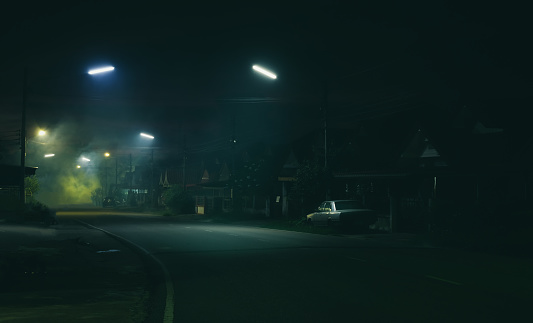

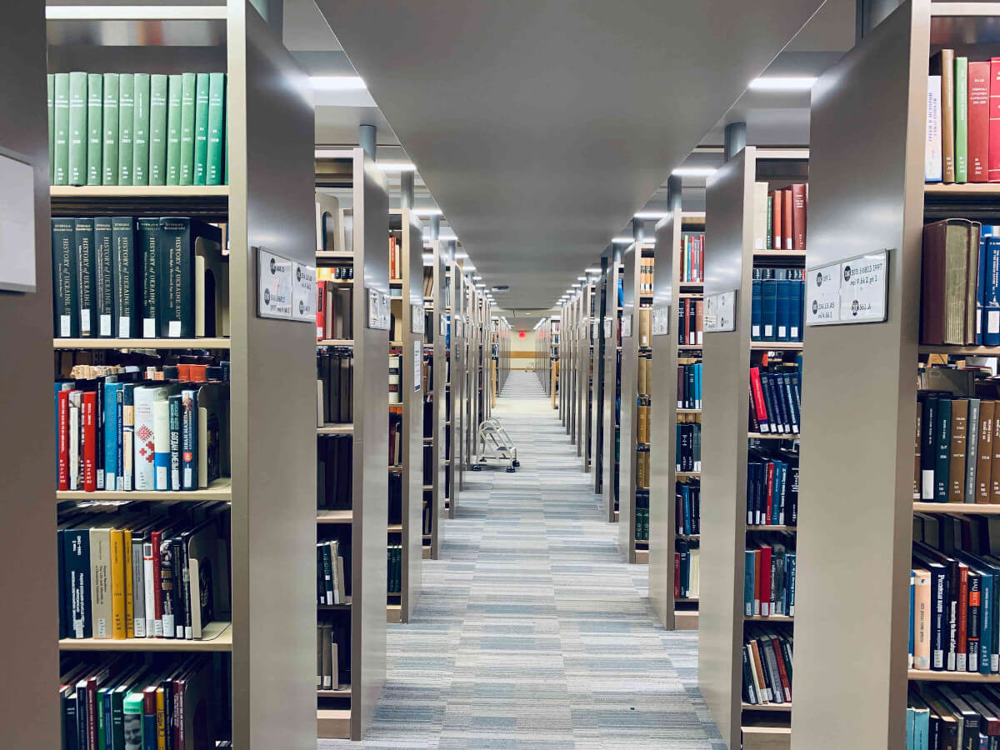

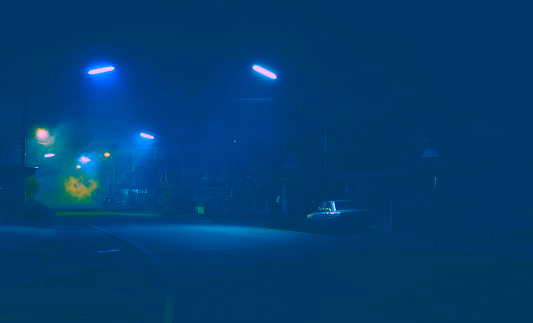

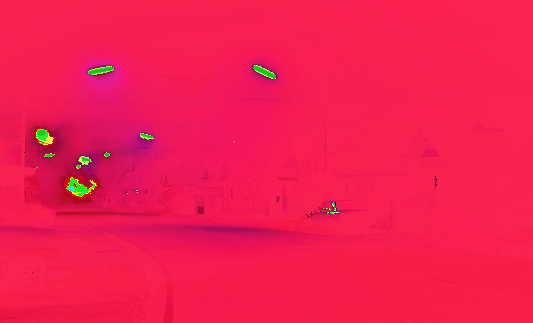

In [ ]:
from IPython.core.display import Image
image = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/istockphoto-1151075791-170667a.jpg", cv2.IMREAD_COLOR)
reference = cv2.imread("/content/drive/MyDrive/SURGE/Color_Constancy/hero3.jpeg", cv2.IMREAD_COLOR)
cv2_imshow(image)
cv2_imshow(reference)
image1 = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
image2 = cv2.cvtColor(reference, cv2.COLOR_BGR2LAB)

L1 = image1[:,:,0]
L2 = image2[:,:,0]
A1 = image1[:,:,1]
A2 = image2[:,:,1]
B1 = image1[:,:,2]
B2 = image2[:,:,2]
# image1[:,:,2] = image[:,:,2]
# (H1, S1, V1) = cv2.split(image1)
# (H2, S2, V2) = cv2.split(image2)
B1 = (B1-np.mean(B1))*np.std(B2)/np.std(B1) + np.mean(B2)
B1 = (B1-np.min(B1))/(np.max(B1)-np.min(B1))*np.max(B2)
L1 = (L1-np.mean(L1))*np.std(L2)/np.std(L1) + np.mean(L2)
L1 = (L1-np.min(L1))/(np.max(L1)-np.min(L1))*np.max(L2)
A1 = (V1-np.mean(A1))*np.std(A2)/np.std(A1) + np.mean(A2)
A1 = (A1-np.min(A1))/(np.max(A1)-np.min(A1))*np.max(A2)
# print(np.shape(H1), np.shape(S1), np.shape(V1))
# image1 = cv2.merge((H1,S1,V1))
image1[:,:,0] = L1
image1[:,:,1] = A1
image1[:,:,2] = B1
# result = image1
result = cv2.cvtColor(image1, cv2.COLOR_LAB2BGR)
# image2 = cv2.GaussianBlur(image1,(5,5),0)
cv2_imshow(result)
cv2_imshow(result-image)

Real Image


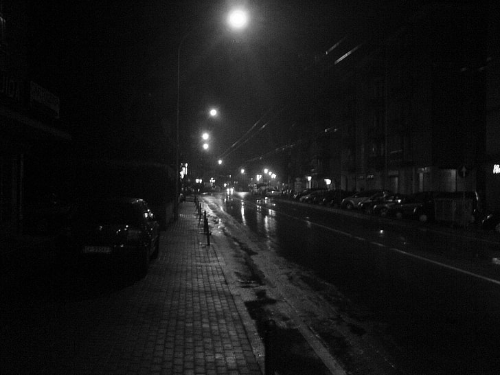

White patch


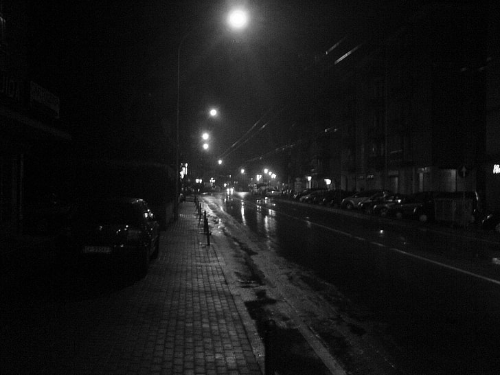

Gray World


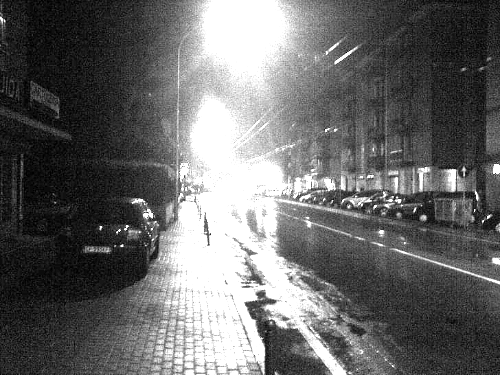

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/man-made-street-dark-night-wallpaper-preview.jpg")

Real Image


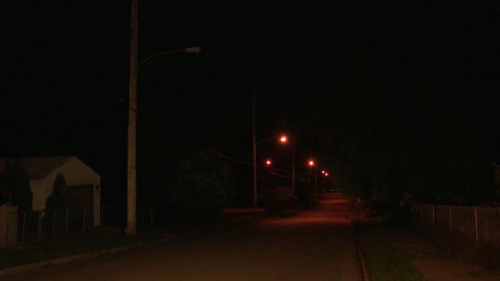

White patch


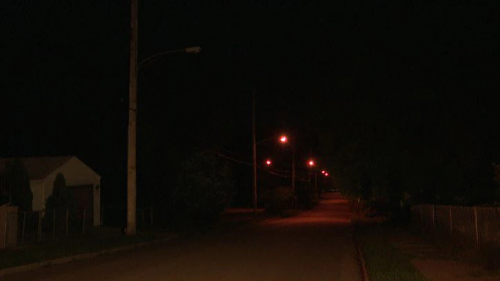

Gray World


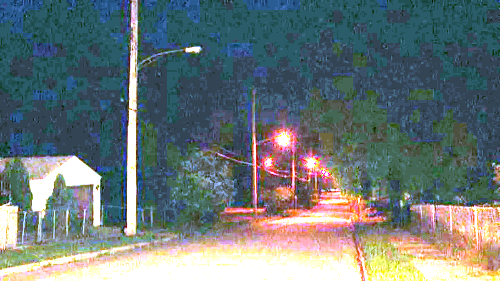

In [ ]:
image_process("/content/drive/MyDrive/SURGE/Color_Constancy/CKLT2MX6TVDMBBTU4USBRINNXM.webp")